## Import Dependencies

In [ ]:
# Dependencies for data preprocessing
import numpy as np  # Numerical computing library, useful for handling arrays.
import pandas as pd  # Library for data manipulation and analysis.
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array  # Tools for image preprocessing and augmentation.
from sklearn.model_selection import train_test_split  # Splitting data into training and testing sets.
from PIL import Image  # Library for image processing tasks.
import cv2  # OpenCV library for image processing and computer vision tasks.
import random  # Generate random numbers and shuffle data.
import glob  # Find files matching a specified pattern.
from sklearn.utils import resample  # Resampling utility for handling imbalanced datasets.

# Dependencies for model building and training
import tensorflow as tf  # Core TensorFlow library for machine learning and deep learning.
from tensorflow.keras.applications import MobileNetV2, MobileNetV3Small  # Pre-trained MobileNet models for transfer learning.
from tensorflow.keras import layers, models, Model, mixed_precision  # Modules for building models and enabling mixed precision.
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint  # Callbacks for training optimization.

# Dependencies for evaluation and visualization
import matplotlib.pyplot as plt  # Plotting library for visualizing data and results.
import seaborn as sns  # Advanced visualization library for statistical graphics.
from sklearn.metrics import confusion_matrix, classification_report  # Performance evaluation metrics for classification models.

# Utilities for file and system operations
import os  # Utilities for interacting with the operating system (e.g., file paths, directories).
import zipfile  # Module for working with ZIP archives.
import shutil  # High-level file operations, such as copying and removing directories.
import time  # Time utilities for measuring performance or logging.

# Miscellaneous utilities
from typing import Tuple, Dict  # Type hinting for function annotations.
from google.colab import files  # Tools for interacting with Google Colab (e.g., uploading/downloading files).


Check For GPU availability

In [ ]:
# Print TensorFlow version and GPU availability
print("TensorFlow version:", tf.__version__)
print("GPU Available:", tf.config.list_physical_devices('GPU'))

TensorFlow version: 2.17.1
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## Import Data

In [ ]:
!pip install kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d alinedobrovsky/plant-disease-classification-merged-dataset -p /content


cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory
Dataset URL: https://www.kaggle.com/datasets/alinedobrovsky/plant-disease-classification-merged-dataset
License(s): CC-BY-NC-SA-4.0
100% 17.3G/17.3G [13:29<00:00, 23.0MB/s]
100% 17.3G/17.3G [13:29<00:00, 23.0MB/s]


### Unzip The Dataset

In [ ]:
dataset_zip_path = "/content/plant-disease-classification-merged-dataset.zip"
dataset_path = "/content/plant_disease_dataset"  # Define the dataset extraction path
os.makedirs(dataset_path, exist_ok=True)

with zipfile.ZipFile(dataset_zip_path, 'r') as zip_ref:
    zip_ref.extractall(dataset_path)
print("Dataset extracted successfully!")

Dataset extracted successfully!


## Filter Specific Classes

In [ ]:
# Classes to keep
selected_classes = [
    'Rice__brown_spot',
    'Rice__healthy',
    'Rice__leaf_blast',
    'Rice__neck_blast',
    'Soybean__caterpillar',
    'Soybean__diabrotica_speciosa',
    'Soybean__healthy',
    'Wheat__brown_rust',
    'Wheat__healthy',
    'Wheat__yellow_rust',
    'Potato__early_blight',
    'Potato__healthy',
    'Potato__late_blight'
]

# Target directory for filtered dataset
filtered_dataset_path = "/content/filtered_plant_disease_dataset"
os.makedirs(filtered_dataset_path, exist_ok=True)

# Move selected classes to the new directory
for class_name in selected_classes:
    source_class_path = os.path.join(dataset_path, class_name)
    target_class_path = os.path.join(filtered_dataset_path, class_name)

    if os.path.exists(source_class_path):
        shutil.copytree(source_class_path, target_class_path)
        print(f"Copied class: {class_name}")
    else:
        print(f"Class {class_name} not found in the dataset.")



Copied class: Rice__brown_spot
Copied class: Rice__healthy
Copied class: Rice__leaf_blast
Copied class: Rice__neck_blast
Copied class: Soybean__caterpillar
Copied class: Soybean__diabrotica_speciosa
Copied class: Soybean__healthy
Copied class: Wheat__brown_rust
Copied class: Wheat__healthy
Copied class: Wheat__yellow_rust
Copied class: Potato__early_blight
Copied class: Potato__healthy
Copied class: Potato__late_blight


### Verify Filtered Dataset

In [ ]:
# Check the structure of the filtered dataset
import os

for root, dirs, files in os.walk(filtered_dataset_path):
    print(f"Directory: {root}, Files: {len(files)}")


Directory: /content/filtered_plant_disease_dataset, Files: 0
Directory: /content/filtered_plant_disease_dataset/Potato__late_blight, Files: 1093
Directory: /content/filtered_plant_disease_dataset/Wheat__yellow_rust, Files: 1132
Directory: /content/filtered_plant_disease_dataset/Wheat__healthy, Files: 1225
Directory: /content/filtered_plant_disease_dataset/Soybean__healthy, Files: 5998
Directory: /content/filtered_plant_disease_dataset/Rice__neck_blast, Files: 1000
Directory: /content/filtered_plant_disease_dataset/Rice__brown_spot, Files: 653
Directory: /content/filtered_plant_disease_dataset/Potato__early_blight, Files: 1096
Directory: /content/filtered_plant_disease_dataset/Potato__healthy, Files: 152
Directory: /content/filtered_plant_disease_dataset/Wheat__brown_rust, Files: 916
Directory: /content/filtered_plant_disease_dataset/Soybean__diabrotica_speciosa, Files: 2205
Directory: /content/filtered_plant_disease_dataset/Rice__healthy, Files: 1488
Directory: /content/filtered_plant_

## EDA

### See The Distribution Among Classes

<ipython-input-9-d8ee591619ba>:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Class', y='Image Count', data=class_counts_sorted, palette='viridis')


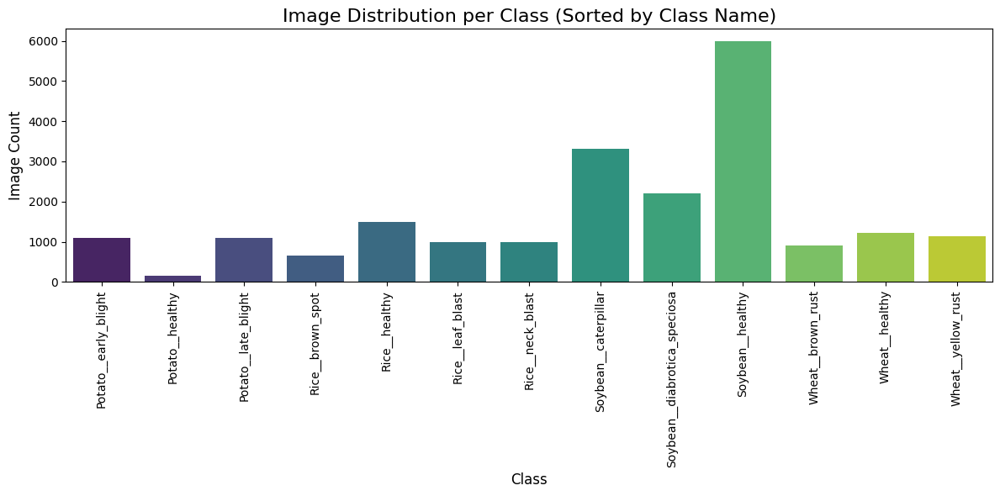

In [ ]:
# Path to the filtered dataset directory
filtered_dataset_path = "/content/filtered_plant_disease_dataset"

# Count the number of images in each class
class_counts = {}
for class_name in os.listdir(filtered_dataset_path):
    class_path = os.path.join(filtered_dataset_path, class_name)
    if os.path.isdir(class_path):
        class_counts[class_name] = len(os.listdir(class_path))

# Convert to a sorted DataFrame for visualization
class_counts_df = pd.DataFrame(list(class_counts.items()), columns=["Class", "Image Count"]).sort_values("Image Count", ascending=False)

# Sort the DataFrame by class name
class_counts_sorted = class_counts_df.sort_values('Class')

# Visualize sorted bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x='Class', y='Image Count', data=class_counts_sorted, palette='viridis')
plt.xticks(rotation=90)
plt.title('Image Distribution per Class (Sorted by Class Name)', fontsize=16)
plt.xlabel('Class', fontsize=12)
plt.ylabel('Image Count', fontsize=12)
plt.tight_layout()
plt.show()


> We notice that there's some imbalance data among the classes. so we will handle that later.

### Plot Image From The Datasets:

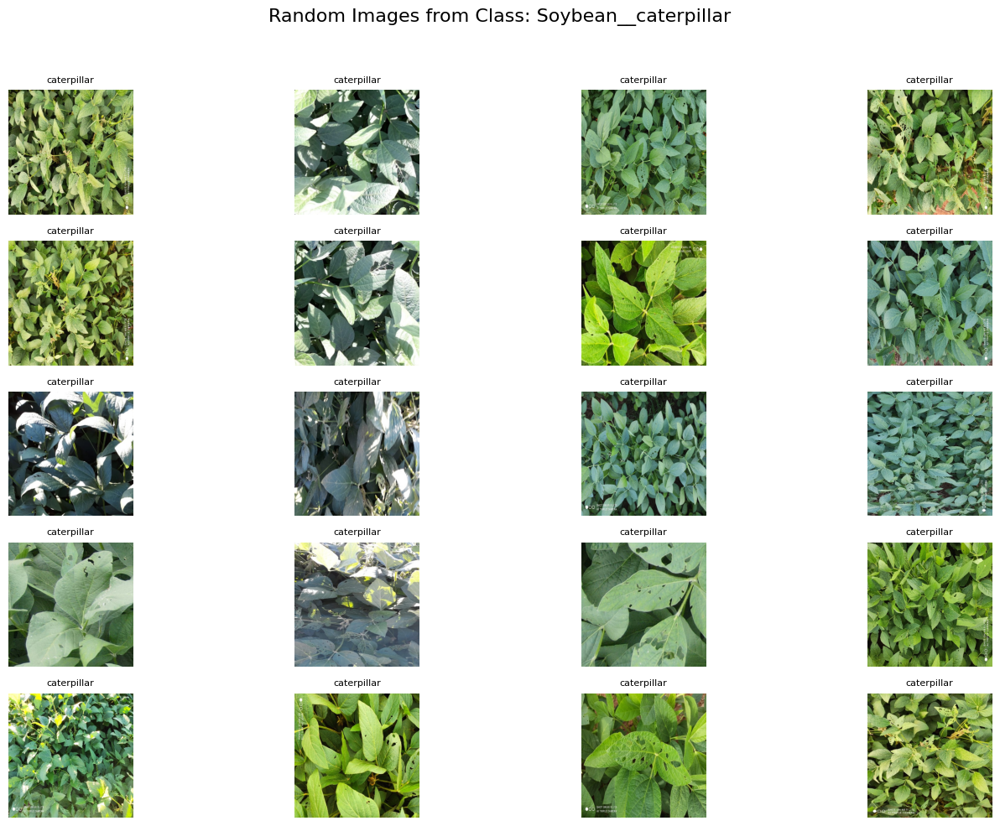

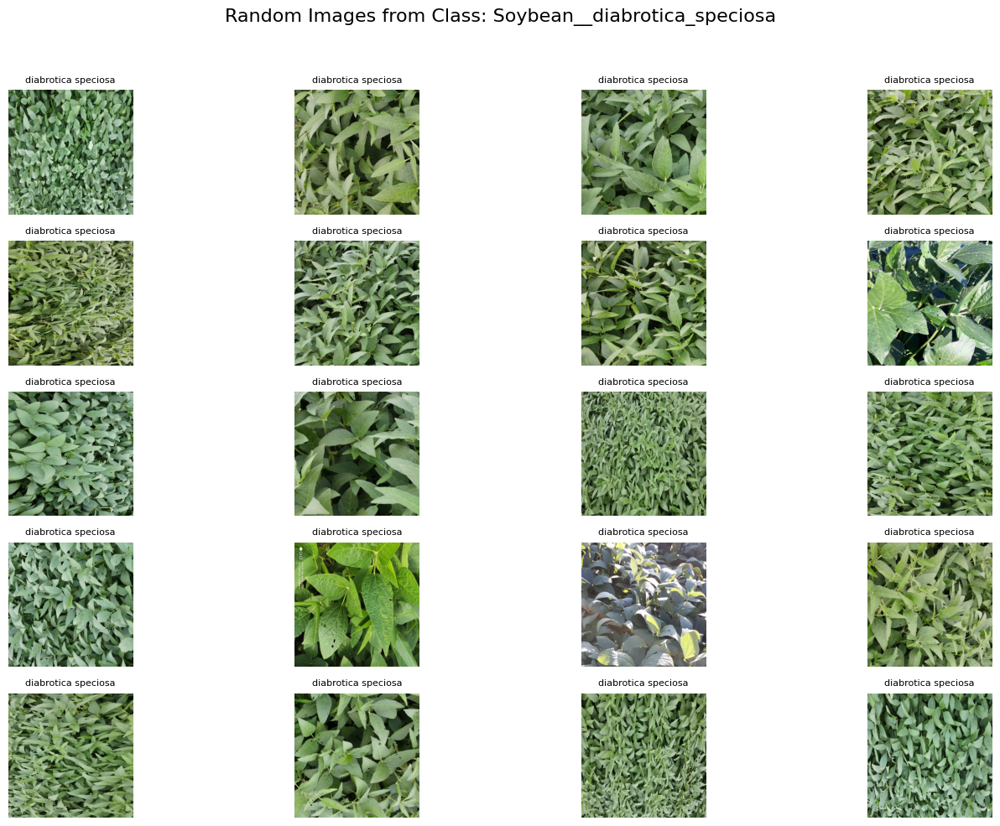

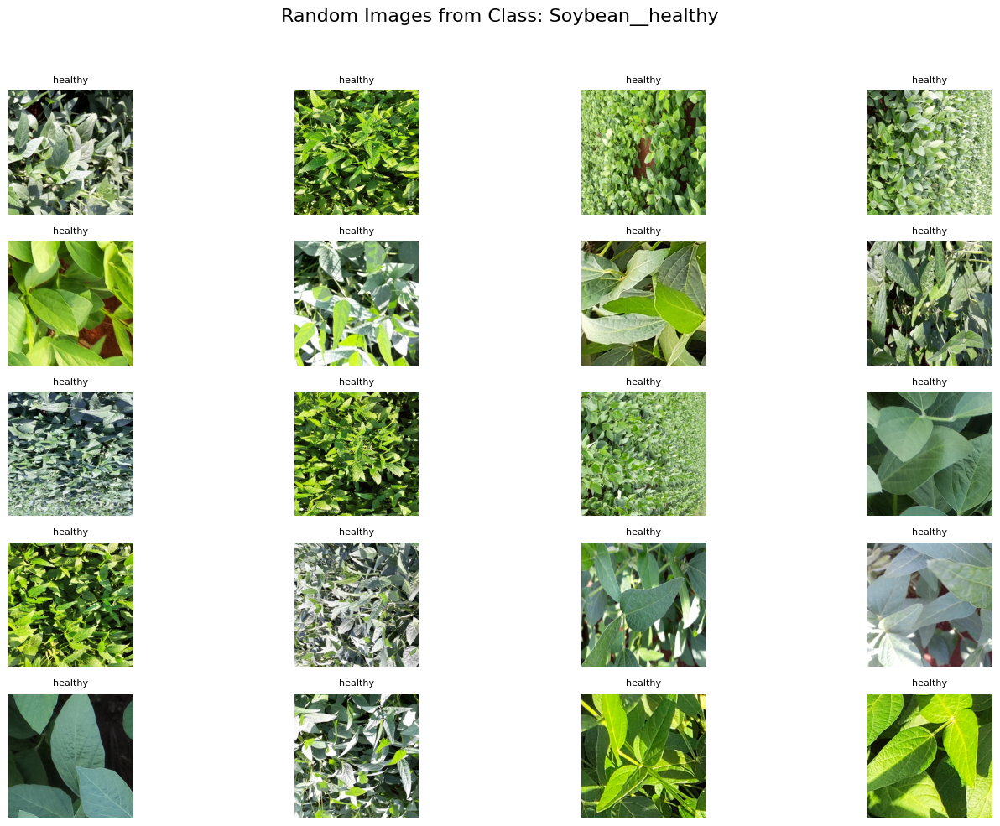

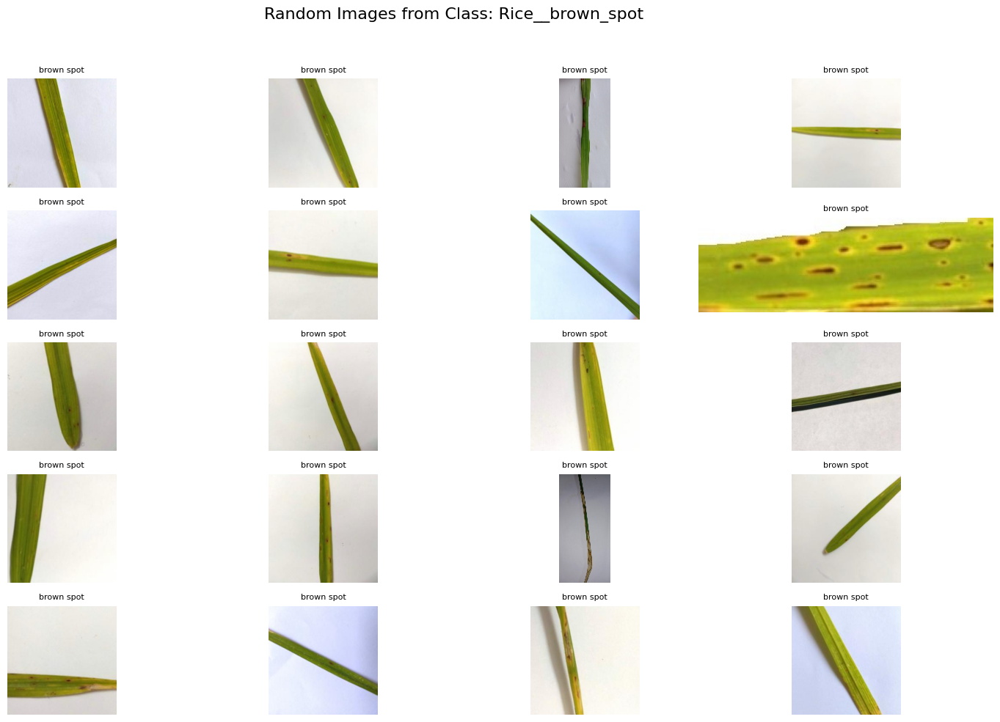

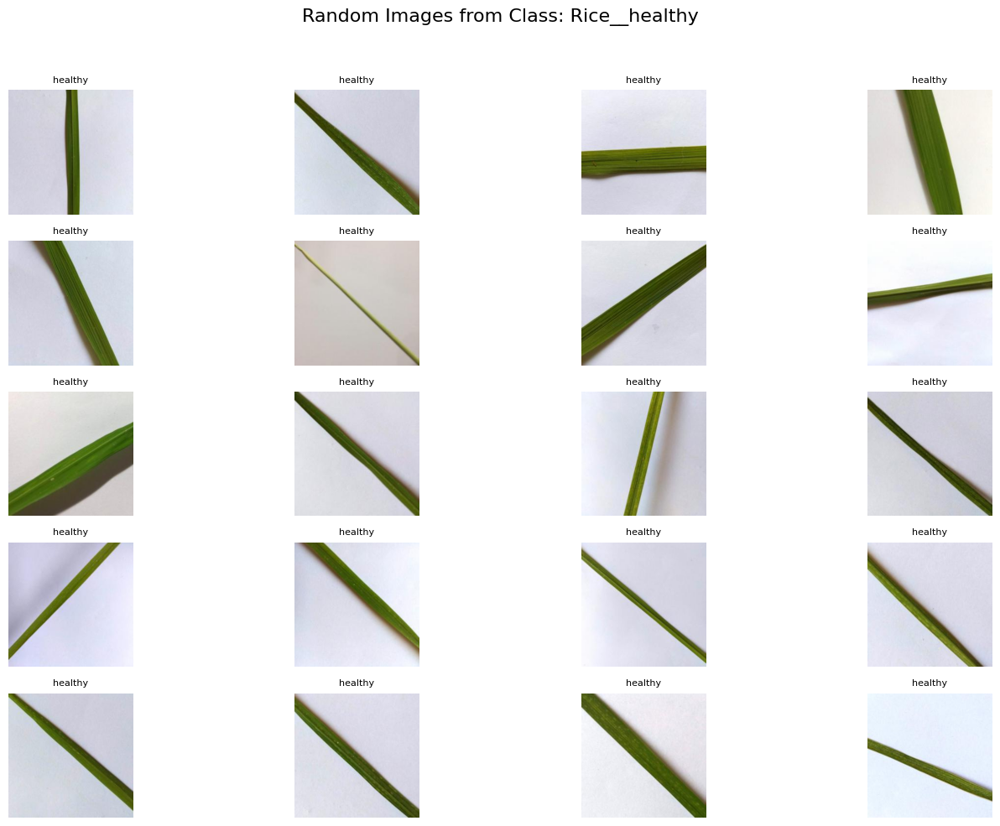

...

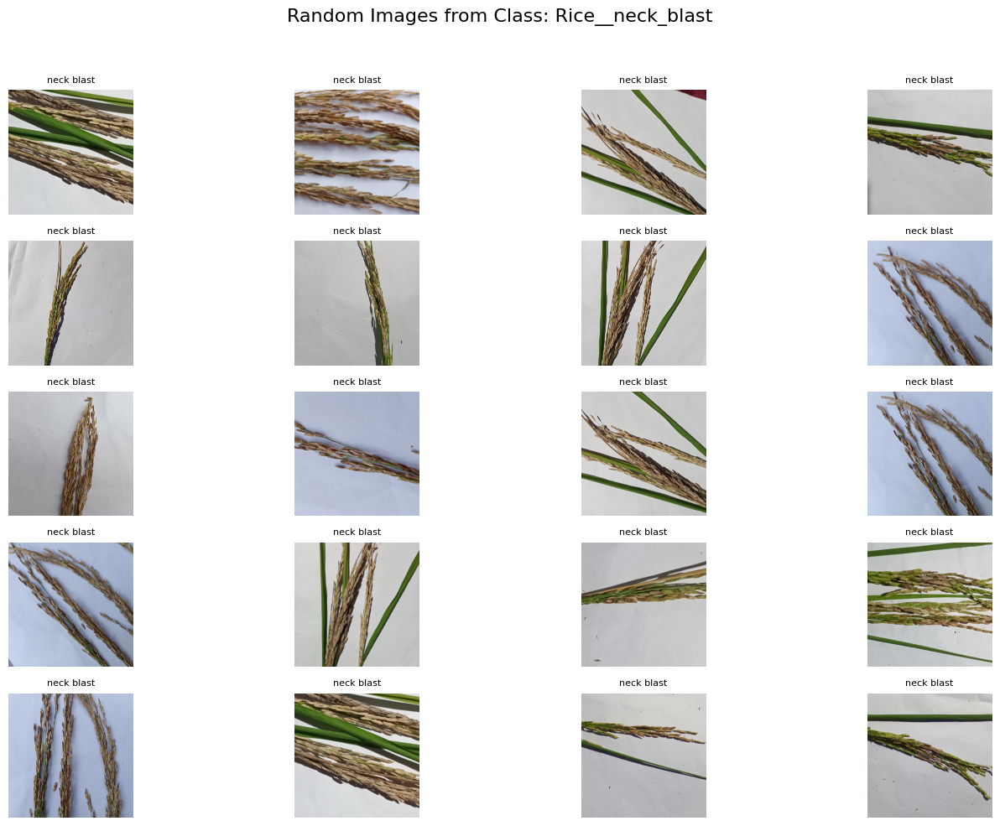

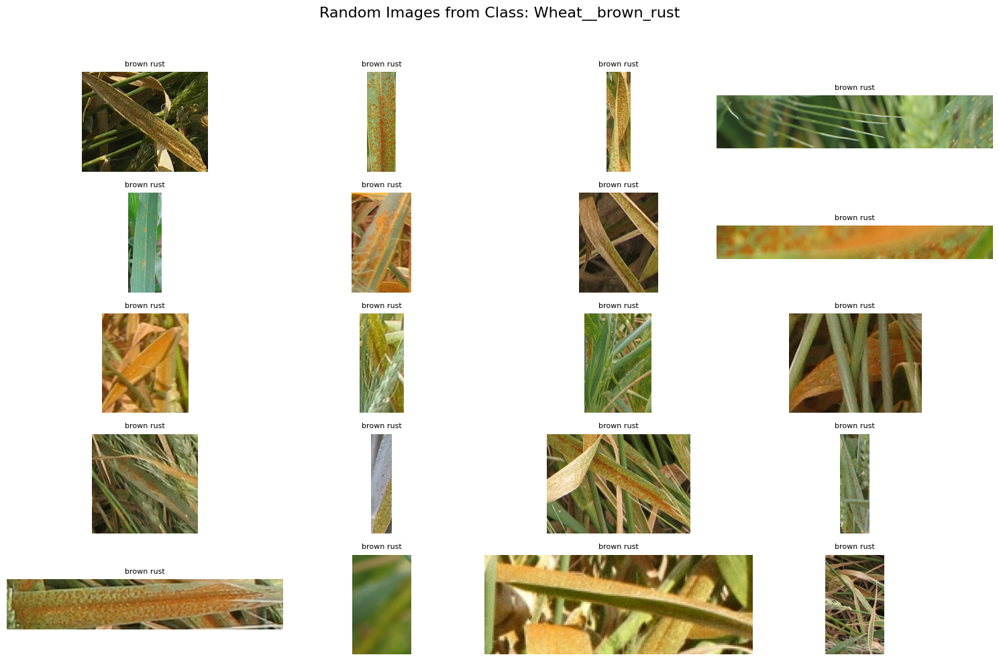

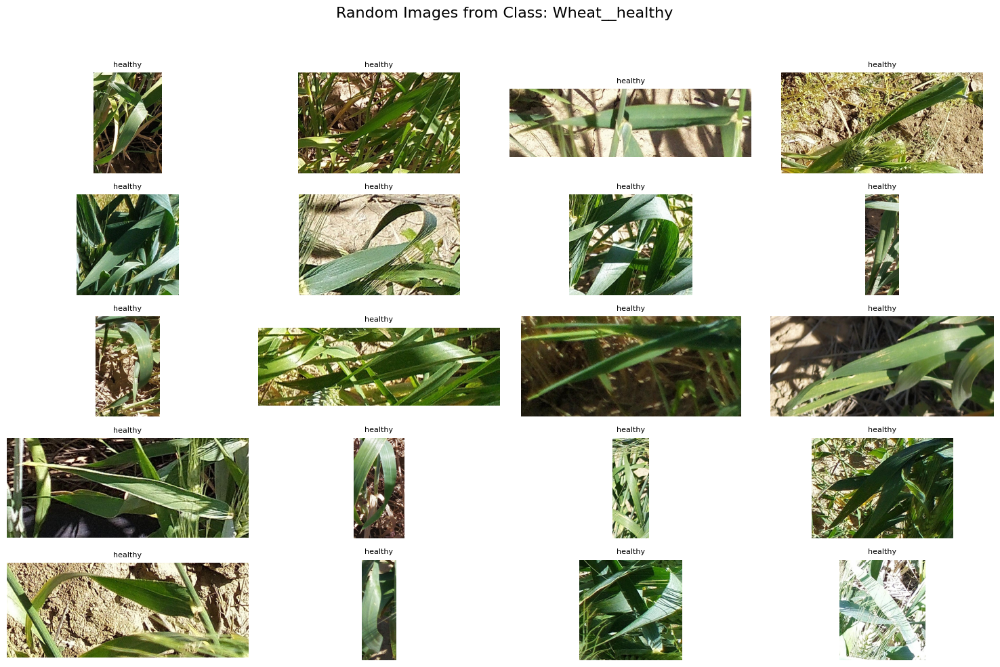

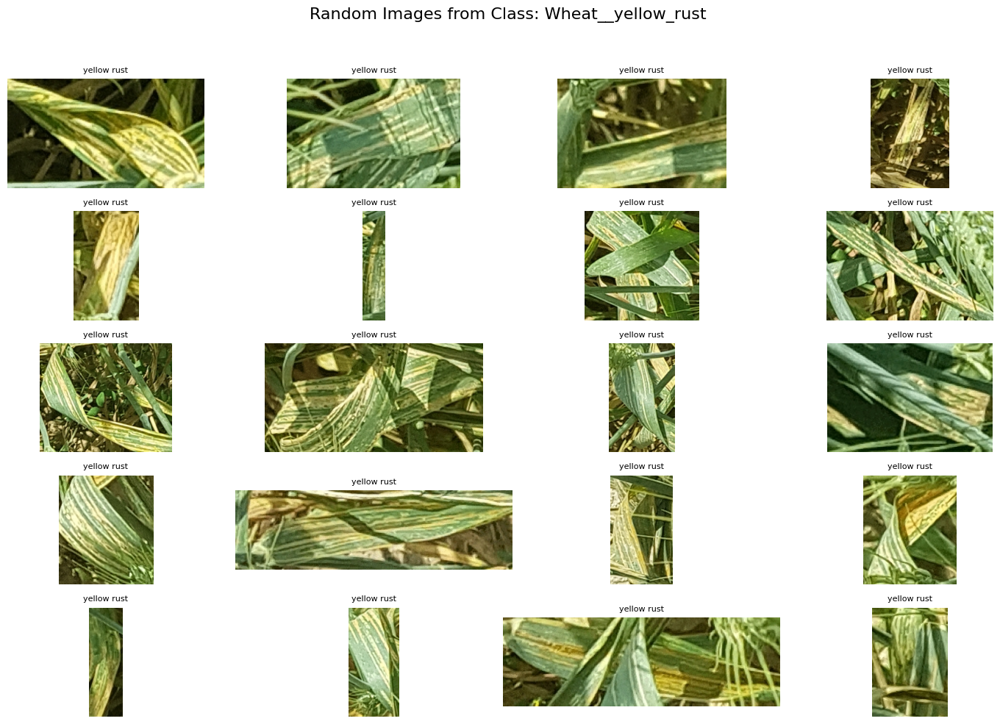

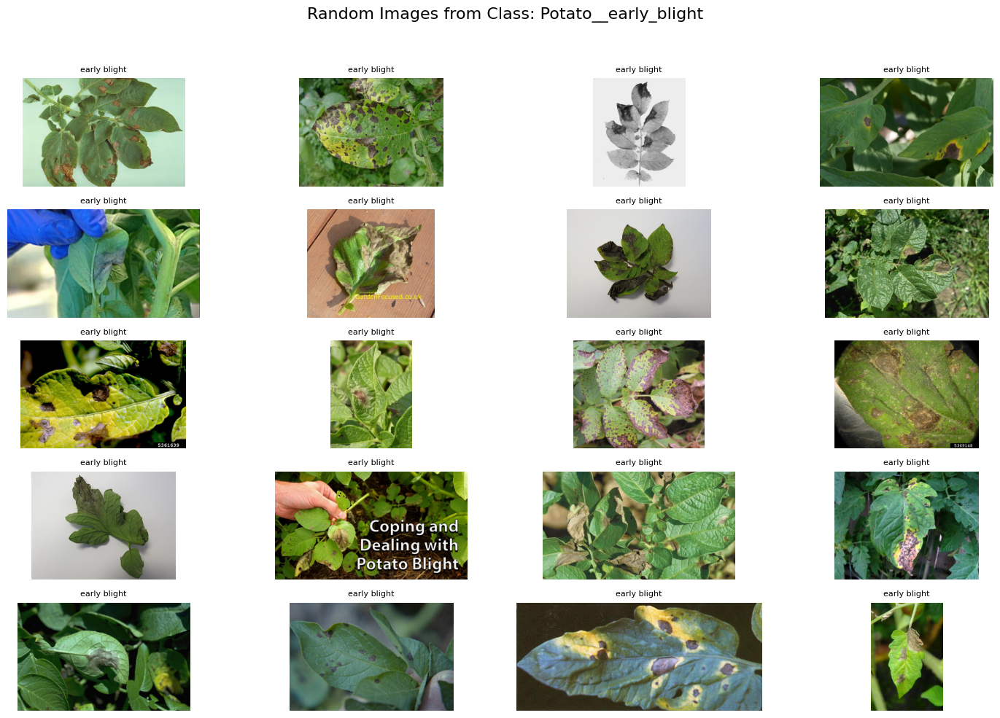

Class 'Potato__healthy' has less than 20 images.


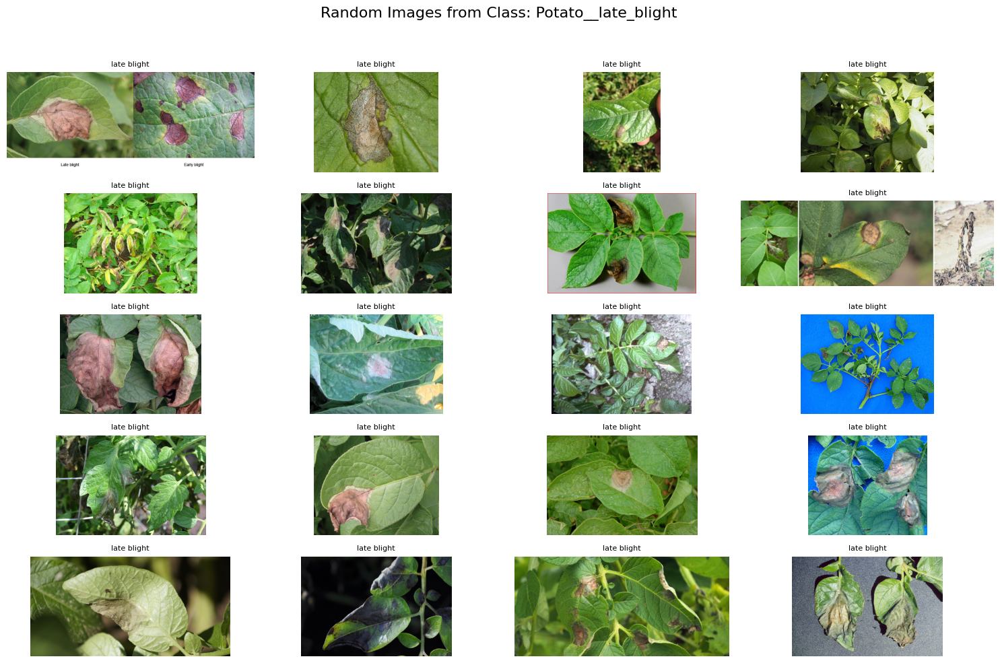

In [ ]:
def plot_images_for_crop(crop_name, filtered_dataset_path, grid_shape=(5, 4)):
    """
    Plot 20 random images for each class of a specific crop.

    :param crop_name: The name of the crop (e.g., 'Corn').
    :param filtered_dataset_path: Path to the filtered dataset.
    :param grid_shape: Tuple for grid layout (rows, columns).
    """
    # Get all classes for the crop
    crop_classes = [class_name for class_name in selected_classes if class_name.startswith(crop_name)]

    for class_name in crop_classes:
        class_path = os.path.join(filtered_dataset_path, class_name)

        if not os.path.exists(class_path):
            print(f"Class '{class_name}' does not exist in the dataset.")
            continue

        # Get all image paths in the class folder
        image_files = glob.glob(os.path.join(class_path, "*.jpg"))
        if len(image_files) < 20:
            print(f"Class '{class_name}' has less than 20 images.")
            continue

        # Randomly select 20 images
        random_images = random.sample(image_files, 20)

        # Plotting the images
        plt.figure(figsize=(15, 10))
        plt.suptitle(f"Random Images from Class: {class_name}", fontsize=16)

        for idx, img_path in enumerate(random_images):
            img = Image.open(img_path)
            plt.subplot(grid_shape[0], grid_shape[1], idx + 1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(class_name.replace(crop_name + "__", "").replace("_", " "), fontsize=8)

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

# Example: Plot images for all Corn classes
plot_images_for_crop("Corn", filtered_dataset_path)

# To visualize for all crops:
for crop in ["Corn", "Soybean", "Cassava", "Rice", "Wheat", "Potato"]:
    plot_images_for_crop(crop, filtered_dataset_path)


> Visualizing the random images from the classes

## Preprocessing

### Handling The Imbalance Class

In [ ]:
class_counts_sorted

,Class,Image Count
6,Potato__early_blight,1096
7,Potato__healthy,152
0,Potato__late_blight,1093
5,Rice__brown_spot,653
10,Rice__healthy,1488
12,Rice__leaf_blast,981
4,Rice__neck_blast,1000
11,Soybean__caterpillar,3309
9,Soybean__diabrotica_speciosa,2205
3,Soybean__healthy,5998


In [ ]:
# Kaggle API setup (assuming your Kaggle API key is already set up)
!pip install kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Download the new dataset
new_dataset_path = "/content/new_plant_disease_dataset"
!kaggle datasets download -d nirmalsankalana/plant-diseases-training-dataset -p /content
!unzip -q /content/plant-diseases-training-dataset.zip -d {new_dataset_path}

cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory
Dataset URL: https://www.kaggle.com/datasets/nirmalsankalana/plant-diseases-training-dataset
License(s): CC0-1.0
100% 1.60G/1.60G [01:14<00:00, 24.2MB/s]
100% 1.60G/1.60G [01:14<00:00, 23.1MB/s]


> So we going to handle the imbalance data by first:

1. Set a treshold on the images range

In [ ]:
# Paths
filtered_dataset_path = "/content/filtered_plant_disease_dataset"  # Path to the filtered dataset
replacement_classes_path = "/content/new_plant_disease_dataset/data"  # Path to the new dataset


In [ ]:
# Define utility functions
def count_images_in_directory(directory):
    """Count number of images in a directory."""
    image_extensions = ('.jpg', '.jpeg', '.png')
    return len([f for f in os.listdir(directory)
               if f.lower().endswith(image_extensions)])

def get_class_counts(base_path):
    """Get counts of images for each class in the dataset."""
    class_counts = {}
    for class_name in os.listdir(base_path):
        class_path = os.path.join(base_path, class_name)
        if os.path.isdir(class_path):
            count = count_images_in_directory(class_path)
            class_counts[class_name] = count
    return class_counts


In [ ]:
# Define target classes and their mappings
target_classes = {
    "Potato__healthy": "Potato___healthy",
    "Rice__brown_spot": "Rice___brown_spot"
}


In [ ]:
# Cell 4: Check initial distributions
filtered_path = "/content/filtered_plant_disease_dataset"
new_dataset_path = "/content/new_plant_disease_dataset/data"

print("Initial distribution of target classes:")
initial_counts = get_class_counts(filtered_path)
for cls in target_classes:
    print(f"{cls}: {initial_counts.get(cls, 0)}")


Initial distribution of target classes:
Potato__healthy: 152
Rice__brown_spot: 653


In [ ]:
# Replace targeted underrepresented classes
def replace_target_classes(filtered_path, new_dataset_path, target_classes):
    """Replace specifically targeted underrepresented classes with random target count."""
    print("\nReplacing target classes:")

    for old_cls, new_cls in target_classes.items():
        # Generate random target count between 900-1100
        target_count = random.randint(900, 1100)

        old_path = os.path.join(filtered_path, old_cls)
        new_cls_path = os.path.join(new_dataset_path, new_cls)

        if not os.path.exists(new_cls_path):
            print(f"Warning: {new_cls} not found in new dataset")
            continue

        # Get current count
        current_count = count_images_in_directory(old_path) if os.path.exists(old_path) else 0
        print(f"\nProcessing {old_cls}:")
        print(f"- Current count: {current_count}")
        print(f"- Target count: {target_count}")

        # Remove existing directory and create new one
        if os.path.exists(old_path):
            shutil.rmtree(old_path)
        os.makedirs(old_path)

        # Get all images from new dataset
        images = [f for f in os.listdir(new_cls_path)
                 if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        # Randomly select target_count images
        selected_images = random.sample(images, min(target_count, len(images)))

        # Copy selected images
        for img in selected_images:
            src = os.path.join(new_cls_path, img)
            dst = os.path.join(old_path, img)
            shutil.copy2(src, dst)

        print(f"- Replaced with {len(selected_images)} images from new dataset")


In [ ]:
# Execute replacement
replace_target_classes(filtered_path, new_dataset_path, target_classes)



Replacing target classes:

Processing Potato__healthy:
- Current count: 152
- Target count: 946
- Replaced with 946 images from new dataset

Processing Rice__brown_spot:
- Current count: 653
- Target count: 923
- Replaced with 923 images from new dataset


In [ ]:
# Downsample overrepresented classes
def downsample_overrepresented_classes(filtered_path, max_count=1100):
    """Downsample classes with too many images."""
    class_counts = get_class_counts(filtered_path)

    print("\nDownsampling overrepresented classes:")
    for cls, count in class_counts.items():
        if count > max_count:
            # Generate random target count between 900-1100
            target_count = random.randint(900, 1100)
            print(f"- {cls}: {count} -> {target_count} images")

            class_path = os.path.join(filtered_path, cls)
            images = [f for f in os.listdir(class_path)
                     if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

            # Randomly select images to remove
            to_remove = random.sample(images, count - target_count)

            # Remove excess images
            for img in to_remove:
                os.remove(os.path.join(class_path, img))


In [ ]:
# Execute downsampling
downsample_overrepresented_classes(filtered_path)


Downsampling overrepresented classes:
- Wheat__yellow_rust: 1132 -> 1075 images
- Wheat__healthy: 1225 -> 1081 images
- Soybean__healthy: 5998 -> 981 images
- Soybean__diabrotica_speciosa: 2205 -> 911 images
- Rice__healthy: 1488 -> 1060 images
- Soybean__caterpillar: 3309 -> 949 images


In [ ]:
# Check final distribution
print("\nFinal class distribution:")
final_counts = get_class_counts(filtered_path)
for cls, count in sorted(final_counts.items()):
    print(f"{cls}: {count}")



Final class distribution:
Potato__early_blight: 1096
Potato__healthy: 946
Potato__late_blight: 1093
Rice__brown_spot: 923
Rice__healthy: 1060
Rice__leaf_blast: 981
Rice__neck_blast: 1000
Soybean__caterpillar: 949
Soybean__diabrotica_speciosa: 911
Soybean__healthy: 981
Wheat__brown_rust: 915
Wheat__healthy: 1081
Wheat__yellow_rust: 1075


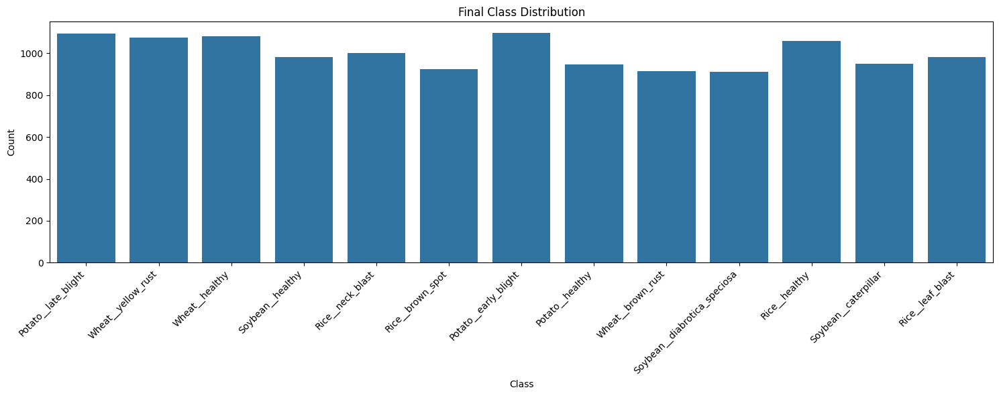

In [ ]:
# Create visualization
plt.figure(figsize=(15, 6))
df_counts = pd.DataFrame(list(final_counts.items()), columns=['Class', 'Count'])
sns.barplot(data=df_counts, x='Class', y='Count')
plt.xticks(rotation=45, ha='right')
plt.title('Final Class Distribution')
plt.tight_layout()
plt.show()

In [ ]:
# Print summary of changes
print("\nSummary of class sizes:")
print("Min class size:", min(final_counts.values()))
print("Max class size:", max(final_counts.values()))
print("Average class size:", sum(final_counts.values()) / len(final_counts))


Summary of class sizes:
Min class size: 911
Max class size: 1096
Average class size: 1000.8461538461538


### Split The Data into training,validation, test split

In [ ]:
def split_dataset(source_dir, train_dir, val_dir, test_dir, train_size=0.6, val_size=0.2):
    # Create directories if they don't exist
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(val_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)

    # Loop through each class directory
    for class_name in os.listdir(source_dir):
        class_path = os.path.join(source_dir, class_name)
        if os.path.isdir(class_path):
            # Get all images in the class directory
            images = os.listdir(class_path)
            random.shuffle(images)  # Shuffle images for randomness

            # Calculate split indices
            total_images = len(images)
            train_end = int(train_size * total_images)
            val_end = train_end + int(val_size * total_images)

            # Split images
            train_images = images[:train_end]
            val_images = images[train_end:val_end]
            test_images = images[val_end:]

            # Copy images to respective directories
            for img in train_images:
                src = os.path.join(class_path, img)
                dst = os.path.join(train_dir, class_name)
                os.makedirs(dst, exist_ok=True)  # Create class directory in train
                shutil.copy(src, dst)
            for img in val_images:
                src = os.path.join(class_path, img)
                dst = os.path.join(val_dir, class_name)
                os.makedirs(dst, exist_ok=True)  # Create class directory in val
                shutil.copy(src, dst)
            for img in test_images:
                src = os.path.join(class_path, img)
                dst = os.path.join(test_dir, class_name)
                os.makedirs(dst, exist_ok=True)  # Create class directory in test
                shutil.copy(src, dst)

            # Print the number of images copied for each class
            print(f"Class '{class_name}': {len(train_images)} train, {len(val_images)} val, {len(test_images)} test")

# Define paths
source_directory = filtered_path
train_directory = "/content/train"
val_directory = "/content/val"
test_directory = "/content/test"

# Split the dataset
split_dataset(source_directory, train_directory, val_directory, test_directory)

Class 'Potato__late_blight': 655 train, 218 val, 220 test
Class 'Wheat__yellow_rust': 645 train, 215 val, 215 test
Class 'Wheat__healthy': 648 train, 216 val, 217 test
Class 'Soybean__healthy': 588 train, 196 val, 197 test
Class 'Rice__neck_blast': 600 train, 200 val, 200 test
Class 'Rice__brown_spot': 553 train, 184 val, 186 test
Class 'Potato__early_blight': 657 train, 219 val, 220 test
Class 'Potato__healthy': 567 train, 189 val, 190 test
Class 'Wheat__brown_rust': 549 train, 183 val, 184 test
Class 'Soybean__diabrotica_speciosa': 546 train, 182 val, 183 test
Class 'Rice__healthy': 636 train, 212 val, 212 test
Class 'Soybean__caterpillar': 569 train, 189 val, 191 test
Class 'Rice__leaf_blast': 588 train, 196 val, 197 test


### Save the the data into drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
destination_directory = "/content/drive/MyDrive/filtered_plant_disease_split_1"

# Copy the folders to the destination directory
shutil.copytree(train_directory, f"{destination_directory}/train")
shutil.copytree(val_directory, f"{destination_directory}/val")
shutil.copytree(test_directory, f"{destination_directory}/test")

'/content/drive/MyDrive/filtered_plant_disease_split_1/test'

### Image Augmentation, Rescaling, and ETC

In [ ]:
# Preprocessing function
def preprocess_data(directory, img_size=(224, 224), batch_size=32):
    # Data augmentation
    datagen = ImageDataGenerator(
        rescale=1.0/255.0,
        rotation_range=180,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest',
        validation_split=0.2  # Use 20% of data for validation
    )

    # Create generators
    train_generator = datagen.flow_from_directory(
        directory,
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical',
        subset='training'
    )

    validation_generator = datagen.flow_from_directory(
        directory,
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical',
        subset='validation'
    )

    return train_generator, validation_generator

# Preprocess data
train_gen, val_gen = preprocess_data(filtered_path)

Found 10455 images belonging to 13 classes.
Found 2609 images belonging to 13 classes.


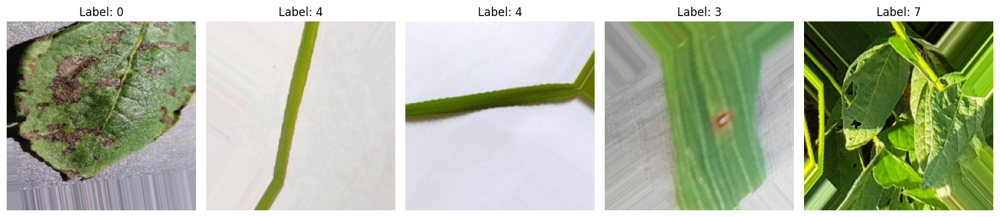

In [ ]:
def visualize_augmented_data(generator, num_images=5):
    # Create a figure with subplots
    plt.figure(figsize=(15, 5))

    # Generate and display augmented images
    for i in range(num_images):
        # Get a batch of images and labels
        x, y = next(generator)

        # Display the first image in the batch
        plt.subplot(1, num_images, i + 1)
        plt.imshow(x[0])  # Show the first image from the batch
        plt.title(f"Label: {np.argmax(y[0])}")  # Show the label (class index)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Visualize augmented images from the training generator
visualize_augmented_data(train_gen)

## Training Model using Transfer Learning

### Model Evaluation (Model V2)

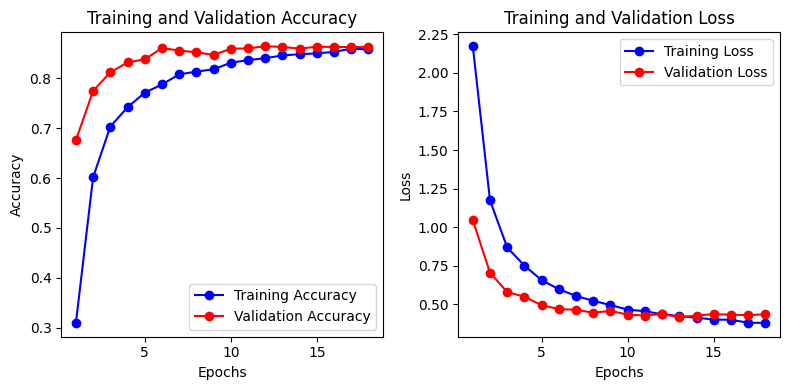

In [ ]:
plot_training_history(history_v2)

82/82 ━━━━━━━━━━━━━━━━━━━━ 47s 540ms/step


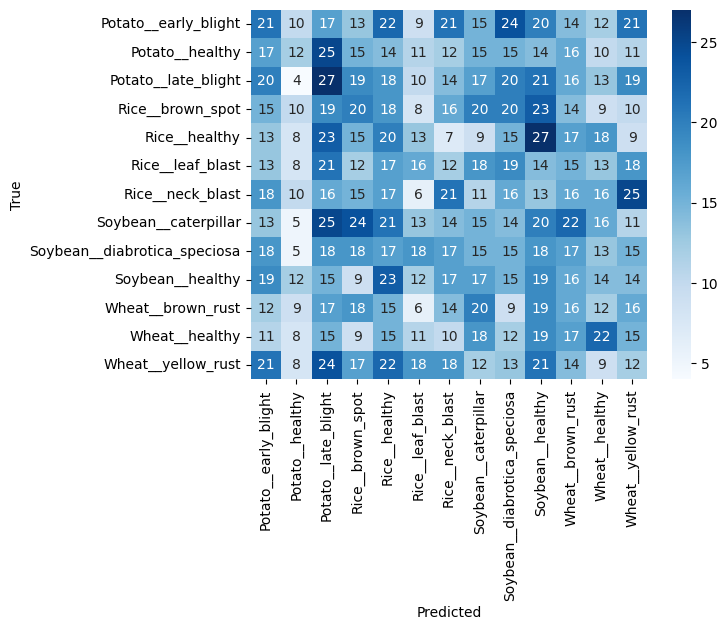

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

y_pred = model_v2.predict(val_gen)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = val_gen.classes
cm = confusion_matrix(y_true, y_pred_classes)

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=val_gen.class_indices.keys(), yticklabels=val_gen.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_true, y_pred_classes, target_names=val_gen.class_indices.keys()))


                              precision    recall  f1-score   support

        Potato__early_blight       0.10      0.10      0.10       219
             Potato__healthy       0.11      0.06      0.08       187
         Potato__late_blight       0.10      0.12      0.11       218
            Rice__brown_spot       0.10      0.10      0.10       202
               Rice__healthy       0.08      0.10      0.09       194
            Rice__leaf_blast       0.11      0.08      0.09       196
            Rice__neck_blast       0.11      0.10      0.11       200
        Soybean__caterpillar       0.07      0.07      0.07       213
Soybean__diabrotica_speciosa       0.07      0.07      0.07       204
            Soybean__healthy       0.08      0.09      0.08       202
           Wheat__brown_rust       0.08      0.09      0.08       183
              Wheat__healthy       0.12      0.12      0.12       182
          Wheat__yellow_rust       0.06      0.06      0.06       209

                  

In [ ]:
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

y_true_bin = label_binarize(y_true, classes=list(range(13)))
roc_auc = roc_auc_score(y_true_bin, y_pred, average='weighted', multi_class='ovr')
print("Weighted ROC-AUC:", roc_auc)


Weighted ROC-AUC: 0.5007052818668535


# Model V3

### Defining The Model & Etc

In [ ]:
def preprocess_data_v3(train_dir, val_dir, img_size=(224, 224), batch_size=32):
    # Data augmentation
    datagen_v3 = ImageDataGenerator(
        rescale=1.0/255.0,
        rotation_range=180,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )

    # Create training generator
    train_gen_v3 = datagen_v3.flow_from_directory(
        train_dir,
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical'
    )

    # Create validation generator
    val_datagen_v3 = ImageDataGenerator(rescale=1.0/255.0)  # No augmentation for validation
    val_gen_v3 = val_datagen_v3.flow_from_directory(
        val_dir,
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical'
    )

    return train_gen_v3, val_gen_v3

# Model building function
def build_model(img_size=(224, 224), num_classes=13):
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(img_size[0], img_size[1], 3))
    base_model.trainable = False  # Freeze the base model

    model_v3 = models.Sequential([
        base_model,
        layers.GlobalAveragePooling2D(),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax')
    ])

    model_v3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                     loss='categorical_crossentropy',
                     metrics=['accuracy'])

    return model_v3

# Training function
def train_model_v3(model_v3, train_gen_v3, val_gen_v3, epochs=50):
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3)

    history_v3 = model_v3.fit(train_gen_v3,
                               validation_data=val_gen_v3,
                               epochs=epochs,
                               callbacks=[early_stopping, reduce_lr])

    return history_v3

In [ ]:
# Preprocess data with the updated function
train_gen_v3, val_gen_v3 = preprocess_data_v3(train_directory, val_directory)

Found 7801 images belonging to 13 classes.
Found 2599 images belonging to 13 classes.


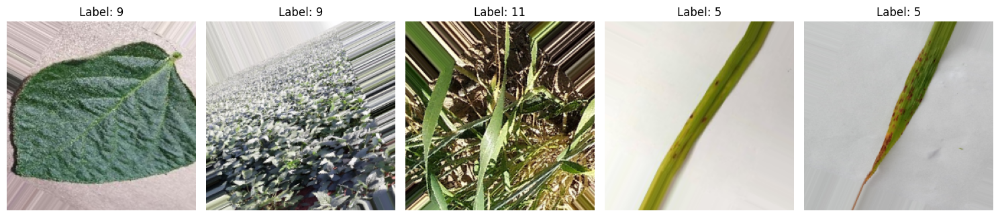

In [ ]:
import matplotlib.pyplot as plt

def visualize_augmented_data(generator, num_images=5):
    # Create a figure with subplots
    plt.figure(figsize=(15, 5))

    # Generate and display augmented images
    for i in range(num_images):
        # Get a batch of images and labels
        x, y = next(generator)

        # Display the first image in the batch
        plt.subplot(1, num_images, i + 1)
        plt.imshow(x[0])  # Show the first image from the batch
        plt.title(f"Label: {np.argmax(y[0])}")  # Show the label (class index)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Visualize augmented images from the training generator
visualize_augmented_data(train_gen_v3)

### Training the Pretrained-Model (Model V3)

In [ ]:
# Train MobileNet V2 with the updated variable names
model_v3 = build_model(num_classes=len(train_gen_v3.class_indices))  # Using model_v3 here
history_v3 = train_model_v3(model_v3, train_gen_v3, val_gen_v3, epochs=50)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


244/244 ━━━━━━━━━━━━━━━━━━━━ 218s 824ms/step - accuracy: 0.1900 - loss: 2.6308 - val_accuracy: 0.6183 - val_loss: 1.2513 - learning_rate: 1.0000e-04
Epoch 2/50
244/244 ━━━━━━━━━━━━━━━━━━━━ 186s 743ms/step - accuracy: 0.5095 - loss: 1.4076 - val_accuracy: 0.7422 - val_loss: 0.8456 - learning_rate: 1.0000e-04
Epoch 3/50
244/244 ━━━━━━━━━━━━━━━━━━━━ 188s 747ms/step - accuracy: 0.6648 - loss: 0.9976 - val_accuracy: 0.7765 - val_loss: 0.6938 - learning_rate: 1.0000e-04
Epoch 4/50
244/244 ━━━━━━━━━━━━━━━━━━━━ 187s 749ms/step - accuracy: 0.7069 - loss: 0.8413 - val_accuracy: 0.7965 - val_loss: 0.6085 - learning_rate: 1.0000e-04
Epoch 5/50
244/244 ━━━━━━━━━━━━━━━━━━━━ 187s 745ms/step - accuracy: 0.7440 - loss: 0.7567 - val_accuracy: 0.8053 - val_loss: 0.5561 - learning_rate: 1.0000e-04
Epoch 6/50
244/244 ━━━━━━━━━━━━━━━━━━━━ 189s 755ms/step - accuracy: 0.7607 - loss: 0.6671 - val_accuracy: 0.8203 - val_loss: 0.5123 - learning_rate: 1.0000e-04
Epoch 7/50
244/244 ━━━━━━━━━━━━━━━━━━━━ 185s 739ms/

### Model Evaluation (Model V3)

In [ ]:
# Plot training/validation accuracy and loss
def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(8, 4)) # Adjust figure size for two separate plots
    plt.subplot(1, 2, 1) # Create subplot for accuracy
    plt.plot(epochs, acc, 'bo-', label='Training Accuracy')
    plt.plot(epochs, val_acc, 'ro-', label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2) # Create subplot for loss
    plt.plot(epochs, loss, 'bo-', label='Training Loss')
    plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout() # Adjust layout to prevent overlapping
    plt.show()

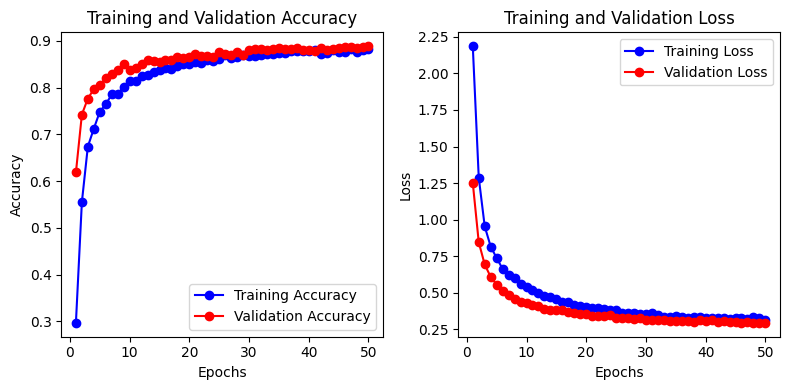

In [ ]:
plot_training_history(history_v3)

In [ ]:
test_directory = "/content/test"

# Create a test data generator (no augmentation)
test_datagen = ImageDataGenerator(rescale=1.0/255.0)

# Create the test generator
test_gen_v3 = test_datagen.flow_from_directory(
    test_directory,
    target_size=(224, 224),  # Same size as training and validation
    batch_size=32,
    class_mode='categorical'  # Adjust based on your output layer
)

# Evaluate the model on the test set
test_loss, test_accuracy = model_v3.evaluate(test_gen_v3)

# Print the evaluation results
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

Found 2611 images belonging to 13 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


82/82 ━━━━━━━━━━━━━━━━━━━━ 33s 405ms/step - accuracy: 0.8944 - loss: 0.2651
Test Loss: 0.2696
Test Accuracy: 0.8977


In [ ]:
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

y_true_bin = label_binarize(y_true, classes=list(range(13)))
roc_auc = roc_auc_score(y_true_bin, y_pred, average='weighted', multi_class='ovr')
print("Weighted ROC-AUC:", roc_auc)


Weighted ROC-AUC: 0.4943233928346195


#### Analyze misclassifications

In [ ]:
def analyze_misclassifications(model, val_gen):
    # Get all images and labels from the validation generator
    all_images, all_labels = [], []
    for images, labels in val_gen:
        all_images.append(images)
        all_labels.append(labels)
        if len(all_images) * val_gen.batch_size >= val_gen.samples:
            break

    # Stack all batches into one array
    all_images = np.vstack(all_images)
    all_labels = np.vstack(all_labels)

    # Make predictions
    predictions = model.predict(all_images)

    # Convert labels and predictions to class indices
    true_labels = np.argmax(all_labels, axis=1)
    pred_labels = np.argmax(predictions, axis=1)

    # Map indices to class names
    class_names = {v: k for k, v in val_gen.class_indices.items()}

    # Find misclassified indices
    misclassified_indices = np.where(true_labels != pred_labels)[0]

    # Create a DataFrame to analyze misclassifications
    misclassified_data = pd.DataFrame({
        'True Class': [class_names[idx] for idx in true_labels[misclassified_indices]],
        'Predicted Class': [class_names[idx] for idx in pred_labels[misclassified_indices]]
    })

    # Count misclassifications per true class
    misclassified_summary = misclassified_data.groupby('True Class').size()

    # Print summary
    print("Misclassification Summary:")
    print(misclassified_summary)

    # Plot misclassification counts for each true class
    misclassified_summary.sort_values(ascending=False).plot(
        kind='bar', figsize=(10, 6), color='orange', edgecolor='black'
    )
    plt.title("Misclassifications Per True Class")
    plt.xlabel("True Class")
    plt.ylabel("Number of Misclassifications")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    return misclassified_data, misclassified_summary

82/82 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step
Misclassification Summary:
True Class
Potato__early_blight            18
Potato__healthy                 17
Potato__late_blight             18
Rice__brown_spot                12
Rice__healthy                   59
Rice__leaf_blast                34
Rice__neck_blast                 2
Soybean__caterpillar            29
Soybean__diabrotica_speciosa    21
Soybean__healthy                26
Wheat__brown_rust               13
Wheat__healthy                   8
Wheat__yellow_rust              10
dtype: int64


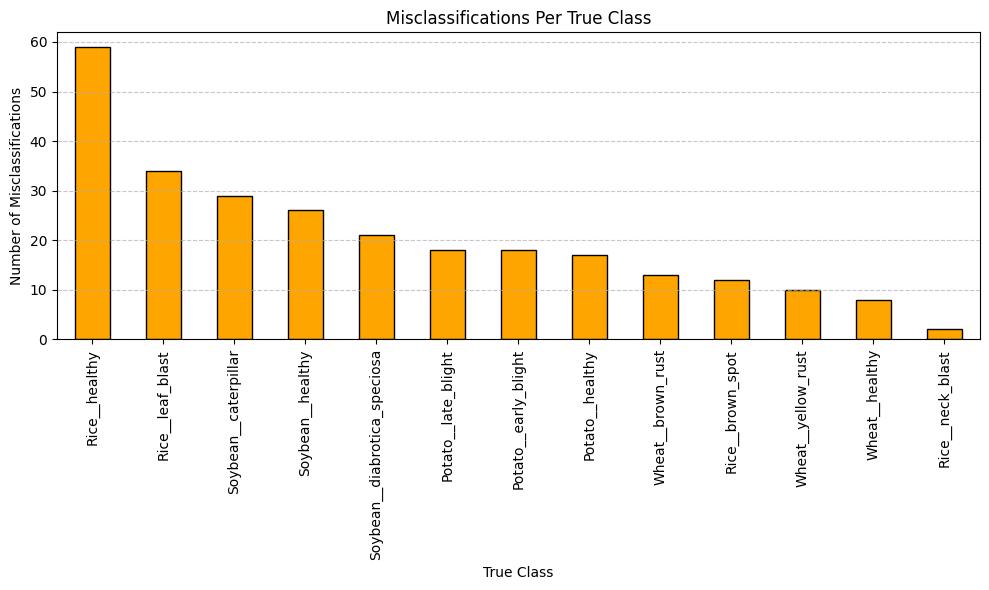

In [ ]:
# Analyze misclassifications
misclassified_data, misclassified_summary = analyze_misclassifications(model_v3, test_gen_v3)


82/82 ━━━━━━━━━━━━━━━━━━━━ 28s 347ms/step


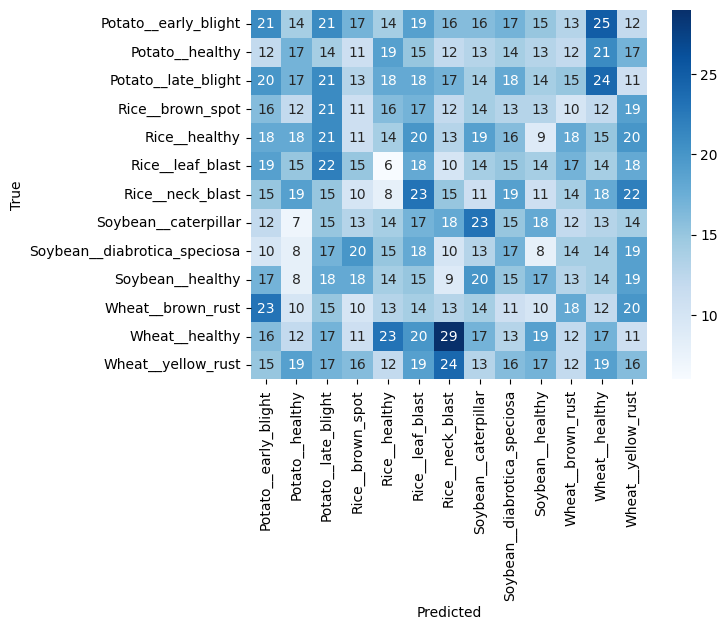

                              precision    recall  f1-score   support

        Potato__early_blight       0.10      0.10      0.10       220
             Potato__healthy       0.10      0.09      0.09       190
         Potato__late_blight       0.09      0.10      0.09       220
            Rice__brown_spot       0.06      0.06      0.06       186
               Rice__healthy       0.08      0.07      0.07       212
            Rice__leaf_blast       0.08      0.09      0.08       197
            Rice__neck_blast       0.08      0.07      0.08       200
        Soybean__caterpillar       0.11      0.12      0.12       191
Soybean__diabrotica_speciosa       0.09      0.09      0.09       183
            Soybean__healthy       0.10      0.09      0.09       197
           Wheat__brown_rust       0.10      0.10      0.10       183
              Wheat__healthy       0.08      0.08      0.08       217
          Wheat__yellow_rust       0.07      0.07      0.07       215

                  

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

y_pred = model_v3.predict(test_gen_v3)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_gen_v3.classes
cm = confusion_matrix(y_true, y_pred_classes)

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_gen_v3.class_indices.keys(), yticklabels=test_gen_v3.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


print(classification_report(y_true, y_pred_classes, target_names=test_gen_v3.class_indices.keys()))


y_true_bin = label_binarize(y_true, classes=list(range(len(test_gen_v3.class_indices))))
roc_auc = roc_auc_score(y_true_bin, y_pred, average='weighted', multi_class='ovr')
print("Weighted ROC-AUC:", roc_auc)

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_true, y_pred_classes, target_names=test_gen_v3.class_indices.keys()))


                              precision    recall  f1-score   support

        Potato__early_blight       0.07      0.07      0.07       220
             Potato__healthy       0.06      0.05      0.05       190
         Potato__late_blight       0.08      0.08      0.08       220
            Rice__brown_spot       0.07      0.07      0.07       186
               Rice__healthy       0.06      0.05      0.06       212
            Rice__leaf_blast       0.08      0.09      0.08       197
            Rice__neck_blast       0.06      0.06      0.06       200
        Soybean__caterpillar       0.08      0.09      0.09       191
Soybean__diabrotica_speciosa       0.08      0.09      0.08       183
            Soybean__healthy       0.06      0.06      0.06       197
           Wheat__brown_rust       0.09      0.09      0.09       183
              Wheat__healthy       0.08      0.08      0.08       217
          Wheat__yellow_rust       0.07      0.07      0.07       215

                  

# Predicting Using The Images from the Internet

In [ ]:

# Preprocessing function
def preprocess_image(image_path, img_size=(224, 224)):
    # Load the image
    img = load_img(image_path, target_size=img_size)
    # Convert the image to an array and scale pixel values
    img_array = img_to_array(img) / 255.0
    # Add a batch dimension
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Prediction function
def predict_uploaded_image(model, class_labels, img_size=(224, 224)):
    # Upload an image
    uploaded = files.upload()
    for file_name in uploaded.keys():
        # Preprocess the uploaded image
        img_array = preprocess_image(file_name, img_size=img_size)

        # Predict
        predictions = model.predict(img_array)
        predicted_class = class_labels[np.argmax(predictions)]

        # Output results
        print(f"Predicted Class: {predicted_class}")
        print(f"Class Probabilities: {predictions[0]}")

# Example usage
# Define the class labels (same order as in your training data)
class_labels = [
    "Potato__early_blight", "Potato__healthy", "Potato__late_blight",
    "Rice__brown_spot", "Rice__healthy", "Rice__leaf_blast", "Rice__neck_blast",
    "Soybean__caterpillar", "Soybean__diabrotica_speciosa", "Soybean__healthy",
    "Wheat__brown_rust", "Wheat__healthy", "Wheat__yellow_rust"
]

# Call the prediction function
predict_uploaded_image(model=model_v3, class_labels=class_labels)


Saving images (1).jpg to images (1) (1).jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Predicted Class: Wheat__brown_rust
Class Probabilities: [5.1667937e-03 7.7757097e-05 2.8508951e-04 1.0551452e-03 1.1473728e-04
 6.3296669e-04 2.1950067e-04 5.8933183e-05 1.3858476e-04 3.0849993e-04
 9.5064336e-01 3.6534183e-02 4.7644447e-03]


# Saving The Model

In [ ]:
model_v3.save('model_v3.h5')
model_v3.save('model_v3.keras') # Keras format
converter = tf.lite.TFLiteConverter.from_keras_model(model_v3)
tflite_model = converter.convert()
with open('model_v3.tflite', 'wb') as f:
  f.write(tflite_model)

Saved artifact at '/tmp/tmp3o0i8ry2'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_154')
Output Type:
  TensorSpec(shape=(None, 13), dtype=tf.float32, name=None)
Captures:
  137523537749344: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137523538568368: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137523538568896: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137523549027520: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137525405652192: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137523544002224: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137523538717936: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137523538709664: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137523538574880: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137523538715648: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137523538

Saved artifact at '/tmp/tmpv9961btw'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_313')
Output Type:
  TensorSpec(shape=(None, 13), dtype=tf.float32, name=None)
Captures:
  137523548356128: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137521771644000: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137521771644352: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137522707594256: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137521771643120: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137522707594960: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137521771648928: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137521771651568: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137521771647520: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137521771649456: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137521771